<h1 style="font-size:30px;">Artistic Image Filters using OpenCV</h1>


This notebook will demonstrate various image manipulation techniques using OpenCV to mimic popular photoshop or instagram filters. In this notebook we will experiment with a wide range of filters, many of which produce artistic renderings of the original image. As you will see in the notebook, many of these effects require some experimentation, and the results for a given filter can vary quite a bit depending on the particular image used. 
We will also deploy these filters using streamlit. Here is a short shot of the [app](https://ahed-jneed-image-filter-app-image-filter-streamlit-app-6nf9ik.streamlit.app/):

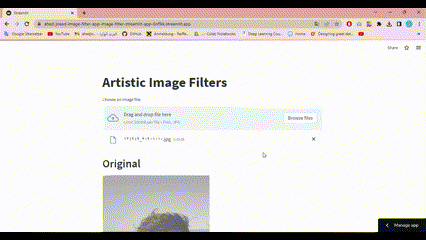

In [1]:
from IPython.display import Image
Image("/kaggle/input/watermark-fotos/Untitled video - Made with Clipchamp.gif")

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import UnivariateSpline
%matplotlib inline

### <font style='color:rgb(50,120,230)'>Load sample images</font>

In [3]:
img1 = cv2.imread('/kaggle/input/watermark-fotos/WhatsApp Image 2022-12-11 at 17.08.16.jpeg')
img2 = cv2.imread('/kaggle/input/watermark-fotos/WhatsApp Image 2022-12-11 at 17.08.18.jpeg')
img3 = cv2.imread('/kaggle/input/watermark-fotos/125458341_3455385601163249_4551555140186956774_n.jpg')

### <font style='color:rgb(50,120,230)'>Function to display original and filtered images</font>

In [4]:
def plot(img1, img2):
    
    fig = plt.figure(figsize = (15,10))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Filtered Image")

    plt.show()

# Black and White Filter

In [5]:
def bw_filter(img):
    img_gray = cv2.cvtColor(img , cv2.COLOR_BGR2GRAY)
    return img_gray

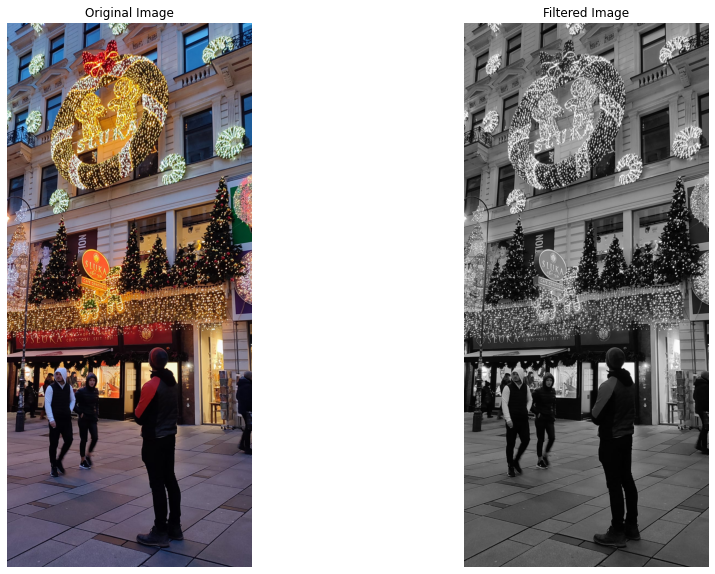

In [6]:
img = img1
img_bw = bw_filter(img)
plot(img, img_bw)

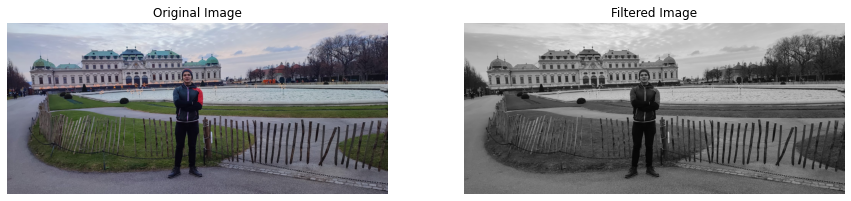

In [7]:
img = img2
img_bw = bw_filter(img)
plot(img, img_bw)

# Sepia / Vintage Filter

## Matrix Transformation
**`transform()`** performs the matrix transformation of every array element.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font color="green">OpenCV Documentation</font>

[**`transform()`**](https://docs.opencv.org/4.5.2/d2/de8/group__core__array.html#ga393164aa54bb9169ce0a8cc44e08ff22) <br>

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

In [8]:
def sepia(img):
    img_sepia = img.copy()
    # Converting to RGB as sepia matrix below is for RGB.
    img_sepia = cv2.cvtColor(img_sepia, cv2.COLOR_BGR2RGB) 
    img_sepia = np.array(img_sepia, dtype = np.float64)
    img_sepia = cv2.transform(img_sepia, np.matrix([[0.393, 0.769, 0.189],
                                                    [0.349, 0.686, 0.168],
                                                    [0.272, 0.534, 0.131]]))
    # Clip values to the range [0, 255].
    img_sepia = np.clip(img_sepia, 0, 255)
    img_sepia = np.array(img_sepia, dtype = np.uint8)
    img_sepia = cv2.cvtColor(img_sepia, cv2.COLOR_RGB2BGR)
    return img_sepia

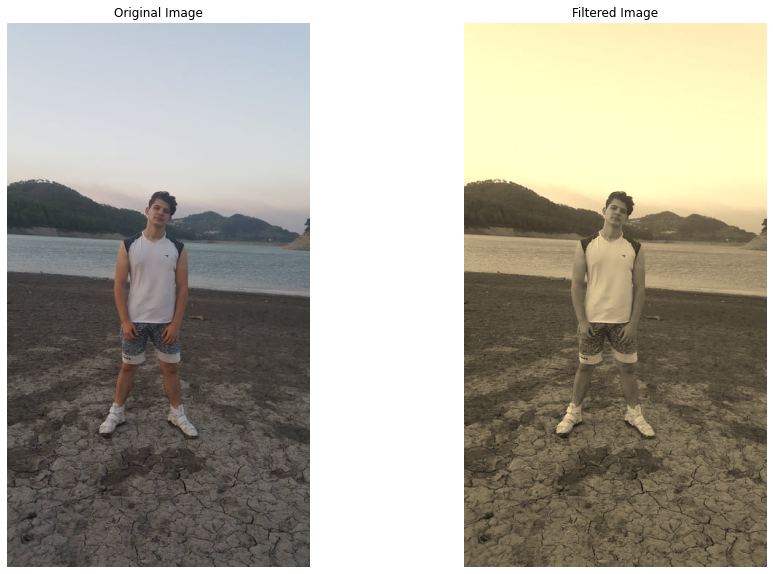

In [9]:
img = img3
img_sepia = sepia(img)
plot(img, img_sepia)

# Vignette Effect 

The vignette effect is achieved by creating a broad 2D Gaussian kernel.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`getGaussianKernel()`**](https://docs.opencv.org/4.5.2/d4/d86/group__imgproc__filter.html#gac05a120c1ae92a6060dd0db190a61afa)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

In [10]:
def vignette(img, level = 2):
    
    height, width = img.shape[:2]  
    
    # Generate vignette mask using Gaussian kernels.
    X_resultant_kernel = cv2.getGaussianKernel(width, width/level)
    Y_resultant_kernel = cv2.getGaussianKernel(height, height/level)
        
    # Generating resultant_kernel matrix.
    kernel = Y_resultant_kernel * X_resultant_kernel.T 
    mask = kernel / kernel.max()
    
    img_vignette = np.copy(img)
        
    # Applying the mask to each channel in the input image.
    for i in range(3):
        img_vignette[:,:,i] = img_vignette[:,:,i] * mask
    
    return img_vignette

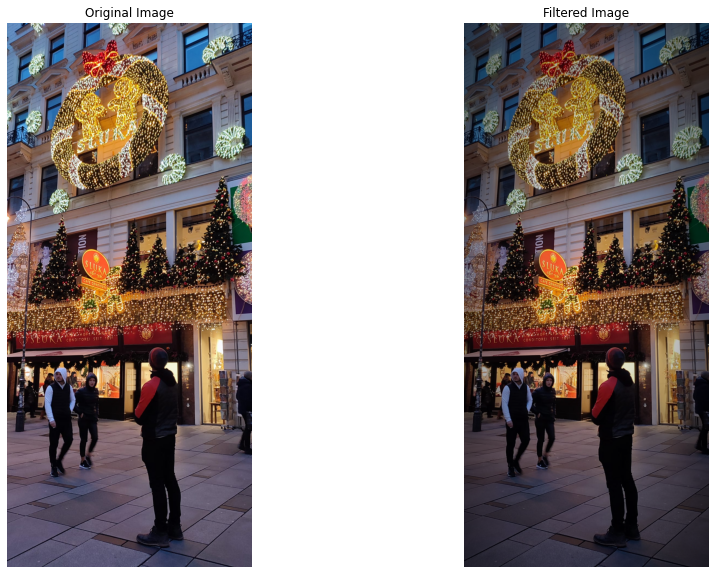

In [11]:
img = img1
img_vignette = vignette(img)
plot(img, img_vignette)

# Blur Filter

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`GaussianBlur()`**](https://docs.opencv.org/4.5.2/d4/d86/group__imgproc__filter.html#gaabe8c836e97159a9193fb0b11ac52cf1)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

In [12]:
def blur_img(img, k=9):
    blur = cv2.GaussianBlur(img, (k,k), 0, 0)
    return blur

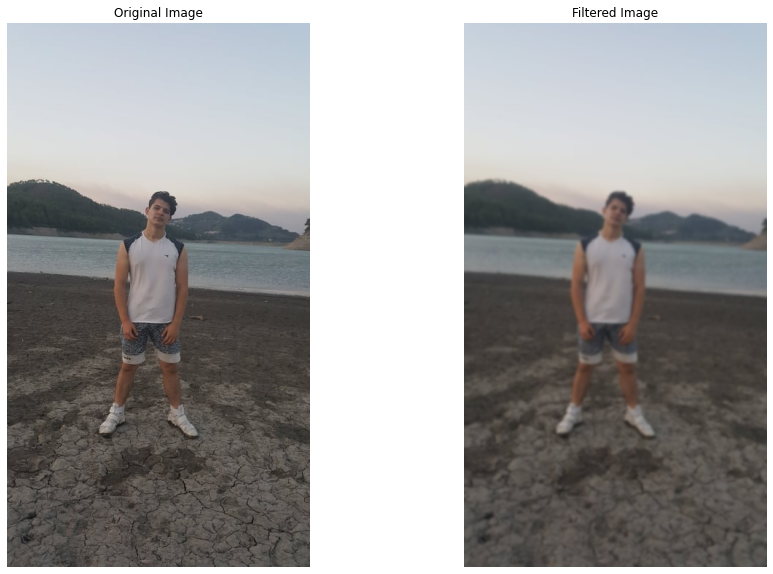

In [13]:
img = img3
blur_img = blur_img(img)
plot(img, blur_img)

# Canny Edge Detection

Canny Edge Detection is one of the most popular edge-detection methods in use today because it is so robust and flexible.
 
 <hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`cv2.Canny()`**](https://docs.opencv.org/4.5.2/dd/d1a/group__imgproc__feature.html#ga04723e007ed888ddf11d9ba04e2232de)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

**Display the filter without bluring**

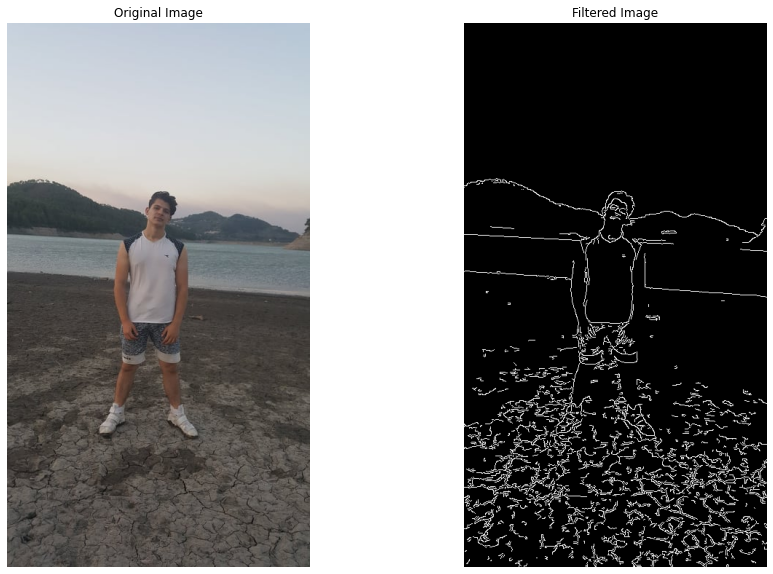

In [14]:
img = img3
img_edges = cv2.Canny(img, 100, 200)
plot(img, img_edges)

**Note**: Blurring is often recommended as a pre-processing step to smooth detail in the image and results in a softer and often more pleasing pencil sketch.

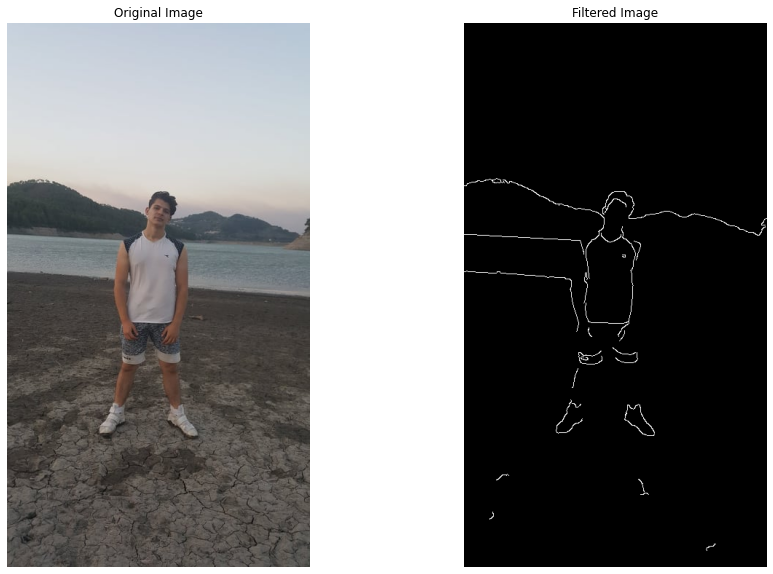

In [15]:
img = img3
img_blur = cv2.GaussianBlur(img, (5,5), 0, 0)
img_edges = cv2.Canny(img_blur, 100, 200)
plot(img, img_edges)

# Sobel Filter

Sobel Edge Detection is one of the most widely used algorithms for edge detection. The Sobel Operator detects edges that are marked by sudden changes in pixel intensity.

`filter2D()` convolves an image with the kernel. The function applies an arbitrary linear filter to an image.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`filter2D()`**](https://docs.opencv.org/4.5.2/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

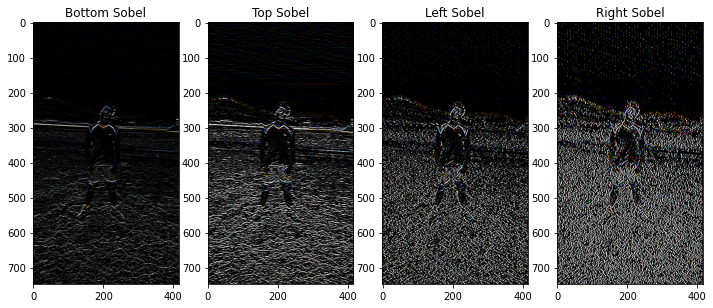

In [16]:
img = img3
# Bottom Sobel Filter
kernel1 = np.array([[-1, -2, -1],
                    [0, 0, 0],
                    [1, 2, 1]])
# Top Sobel Filter
kernel2 = np.array([[1, 2, 1],
                    [0, 0, 0],
                    [-1, -2, -1]])
# Left Sobel Filter
kernel3 = np.array([[1, 0, -1],
                    [2, 0, -2],
                    [1, 0, -1]])
# Right Sobel Filter
kernel4 = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

kernels = [kernel1, kernel2, kernel3, kernel4]
kernel_name = ['Bottom Sobel', 'Top Sobel', 'Left Sobel', 'Right Sobel']

figure, axis = plt.subplots(1,4, figsize=(12,10))
for kernel, name, ax in zip(kernels, kernel_name, axis.flatten()):
     img = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REPLICATE)
     ax.imshow(abs(img), cmap='gray')
     ax.set_title(name)

# Embossed Edges

## Convolving Images with a Kernel

`filter2D()` convolves an image with the kernel. The function applies an arbitrary linear filter to an image.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`filter2D()`**](https://docs.opencv.org/4.5.2/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

In [17]:
def embossed_edges(img):
    
    kernel = np.array([[0, -3, -3], 
                       [3,  0, -3], 
                       [3,  3,  0]])
    
    img_emboss = cv2.filter2D(img, -1, kernel=kernel)
    return img_emboss

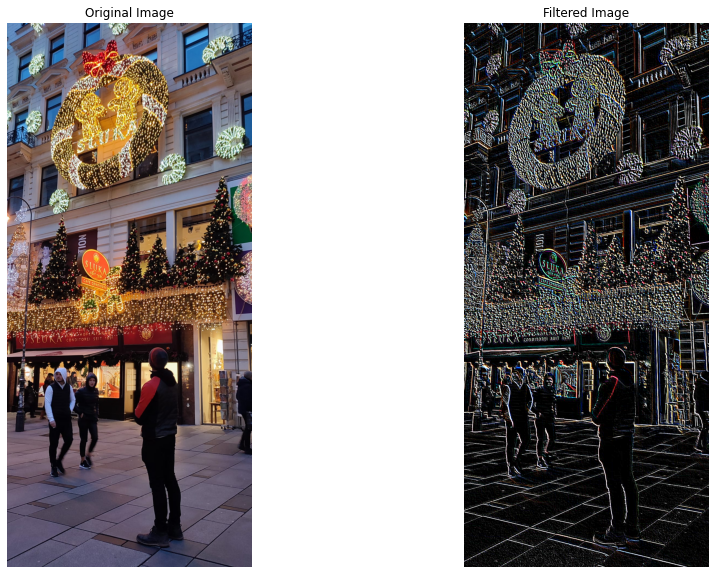

In [18]:
img = img1
img_emboss = embossed_edges(img)
cv2.imwrite('filtered_image.png', img_emboss)
plot(img, img_emboss)

# Improving Exposure

`convertScaleAbs()` scales, calculates absolute values, and converts the result to 8-bit.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`convertScaleAbs()`**](https://docs.opencv.org/4.5.2/d2/de8/group__core__array.html#ga3460e9c9f37b563ab9dd550c4d8c4e7d)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />                     

**Note:** The beta value can be changed to get the appropriate results.

* A positive value indicates a bright image. 
* A negative value indicates a darker image.

In [19]:
def bright(img, level):
    img_bright = cv2.convertScaleAbs(img, beta = level)
    return img_bright

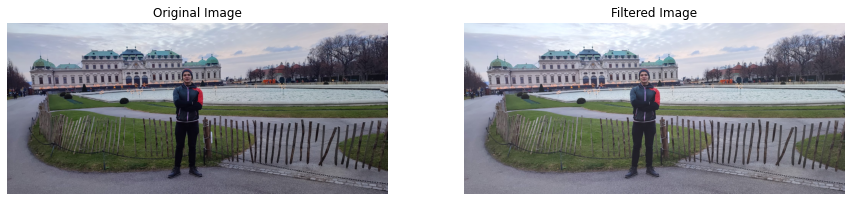

In [20]:
img = img2
img_bright = bright(img, 25)
plot(img, img_bright)

# Outline Filter

In [21]:
def outline(img, k = 9):
    
    k = max(k,9)
    kernel = np.array([[-1, -1, -1],
                       [-1,  k, -1],
                       [-1, -1, -1]])
    
    img_outline = cv2.filter2D(img, ddepth = -1, kernel = kernel)

    return img_outline

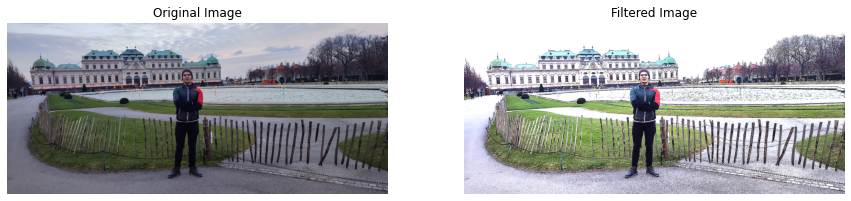

In [22]:
img = img2
img_outline = outline(img, k = 10)
plot(img, img_outline)

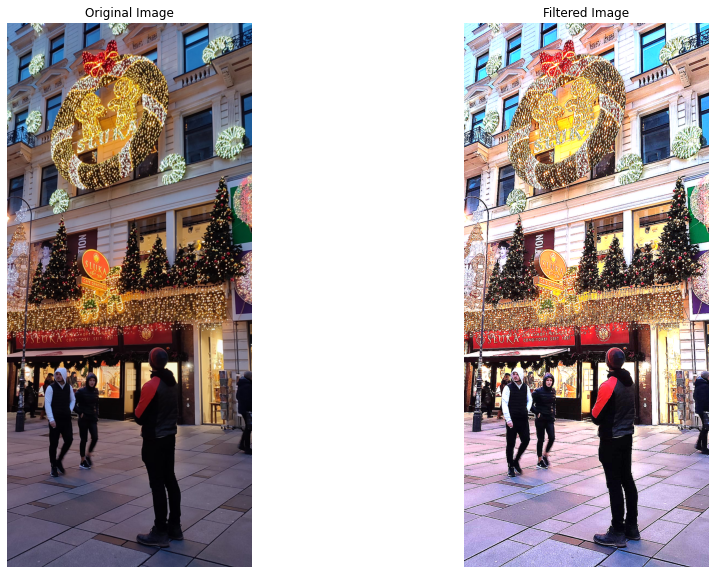

In [23]:
img = img1
img_outline = outline(img, k = 10)
plot(img, img_outline)

# Pencil Sketch Filter


**`pencilSketch()`** Creates a pencil-like non-photorealistic line drawing.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font color="green">OpenCV Documentation</font>

[**`pencilSketch()`**](https://docs.opencv.org/4.5.2/df/dac/group__photo__render.html#gae5930dd822c713b36f8529b21ddebd0c) <br>

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

**Note**: Blurring is often recommended as a pre-processing step to smooth detail in the image and results in a softer and often more pleasing pencil sketch.

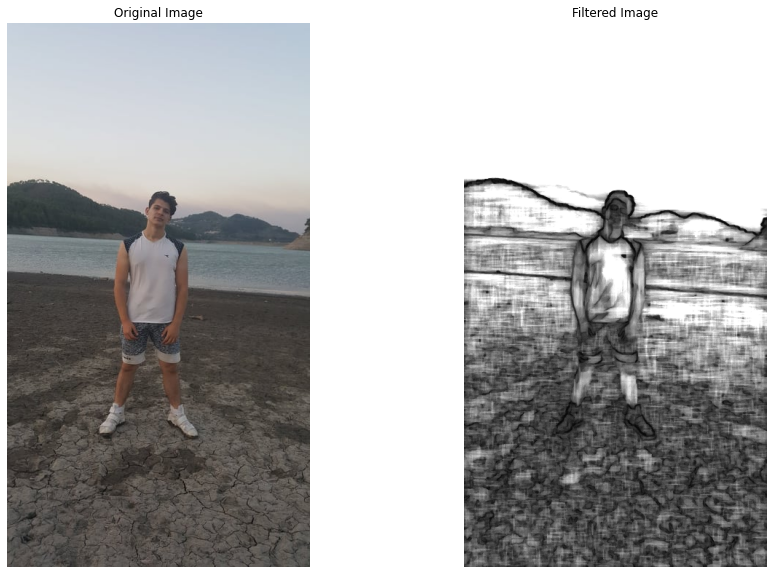

In [24]:
img = img3
img_blur = cv2.GaussianBlur(img, (5,5), 0, 0)
img_sketch_bw, _ = cv2.pencilSketch(img_blur)
plot(img, img_sketch_bw)

# Stylization Filter

**`stylization()`** aims to produce digital imagery with a wide variety of effects not focused on photorealism. Edge-aware filters are ideal for stylization, as they can abstract regions of low contrast while preserving, or enhancing, high-contrast features.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font color="green">OpenCV Documentation</font>

[**`stylization()`**](https://docs.opencv.org/4.5.2/df/dac/group__photo__render.html#gacb0f7324017df153d7b5d095aed53206) <br>

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

**Note**: Blurring is often recommended as a pre-processing step to smooth detail in the image and results in a softer and often more pleasing result.

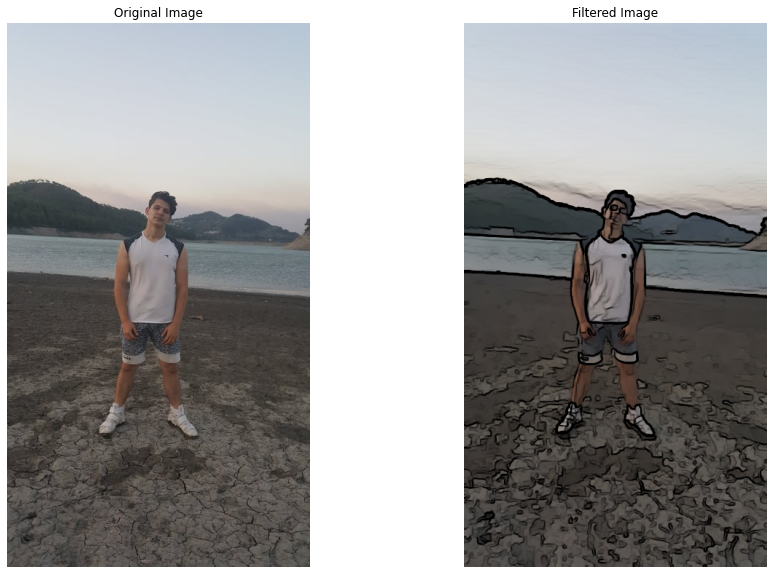

In [25]:
img = img3
img_blur = cv2.GaussianBlur(img, (5,5), 0, 0)
img_style = cv2.stylization(img_blur, sigma_s = 10, sigma_r = 0.1)
#cv2.imwrite
plot(img, img_style)

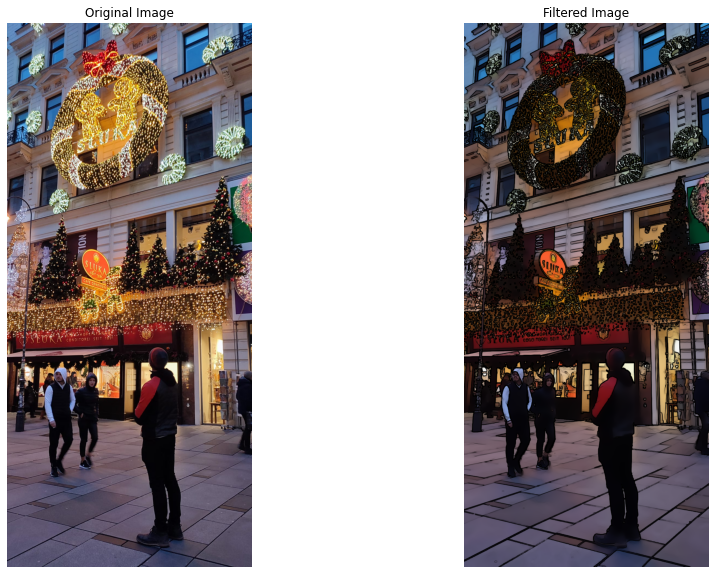

In [26]:
img = img1
blur_img = cv2.GaussianBlur(img, (5,5), 0,0)
img_style = cv2.stylization(blur_img, sigma_s = 10, sigma_r = 0.3)
plot(img, img_style)

**I recommend you to play with the sigmas to get different nice results. It's amazing, Right!!**

# Image Sharpening

We can sharpen an image with the following 2D-convolution kernel.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`filter2D()`**](https://docs.opencv.org/4.5.2/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

In [27]:
def sharping_filter(img, k=5):
    kernel = np.array([[ 0, -1,  0],
                       [-1,  k, -1],
                       [ 0, -1,  0]])
    img_sharp = cv2.filter2D(img, ddepth = -1, kernel = kernel)
    # Clip values to the range [0, 255].
    img_sharp = np.clip(img_sharp, 0, 255)
    return img_sharp

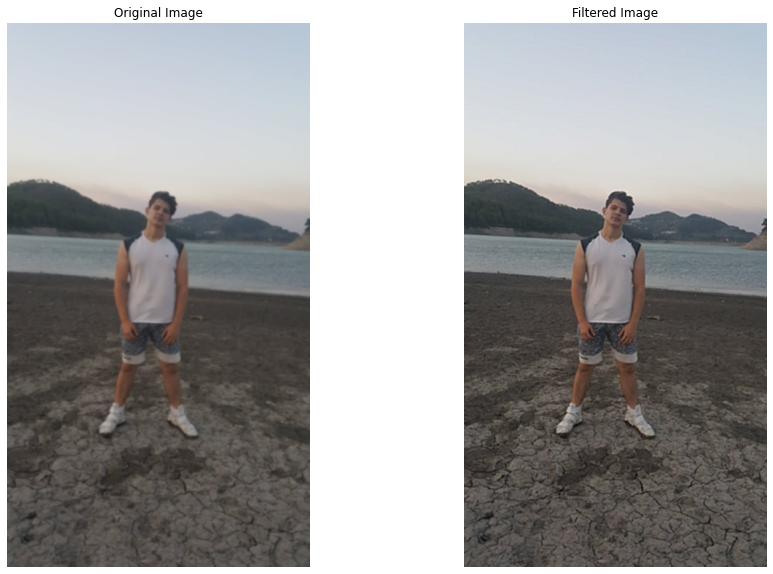

In [28]:
img = img3
img_blur = cv2.GaussianBlur(img, (5,5), 0, 0)
img_sharp = sharping_filter(img_blur)
plot(img_blur, img_sharp)

# HDR effect

The HDR effect is used a lot as it increases the level of detail in images.

[`cv2.detailEnhance()`](https://docs.opencv.org/3.4/df/dac/group__photo__render.html#ga0de660cb6f371a464a74c7b651415975)This filter enhances the details of a particular image.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[`cv2.detailEnhance()`](https://docs.opencv.org/3.4/df/dac/group__photo__render.html#ga0de660cb6f371a464a74c7b651415975)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

In [29]:
def HDR(img):
    img_hdr = cv2.detailEnhance(img, sigma_s = 10, sigma_r = 0.1)
    return img_hdr

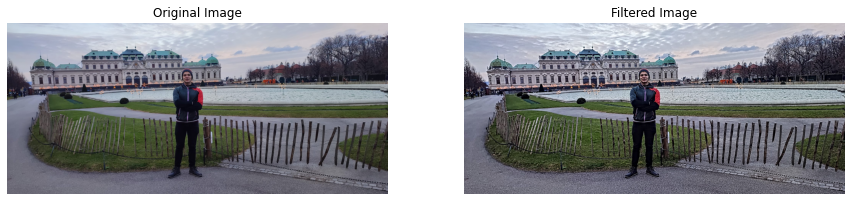

In [30]:
img = img2
img_hdr = HDR(img)
plot(img, img_hdr)

# Invert Filter

If you benefit from viewing items against a dark background, you can use Invert Colors to change how content is displayed on your screen.

`bitwise_not()` Inverts every bit of an array. This can be done by subtracting the pixel values by 255.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

### <font color="green">OpenCV Documentation</font>

[**`bitwise_not()`**](https://docs.opencv.org/4.5.2/d2/de8/group__core__array.html#ga0002cf8b418479f4cb49a75442baee2f) <br>

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

In [31]:
def invert(img):
    img_inv = cv2.bitwise_not(img)
    return img_inv

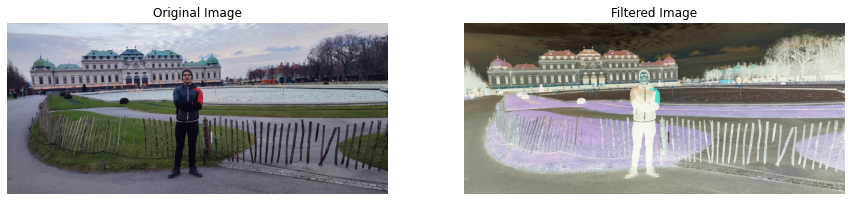

In [32]:
img = img2
img_inv = invert(img)
plot(img, img_inv)

# Summer or Warm Effect Filter

a summer, warm effect filter, it basically increases the warmth of an image. To implement this, we are going to increase the values in the red channel and decrease the values in the blue channel.

In [33]:
def warm_filter(img):
    # We are giving y values for a set of x values.
    # And calculating y for [0-255] x values accordingly to the given range.
    increase_table = UnivariateSpline(x=[0, 64, 128, 255], y=[0, 75, 155, 255])(range(256))
 
    # Similarly construct a lookuptable for decreasing pixel values.
    decrease_table = UnivariateSpline(x=[0, 64, 128, 255], y=[0, 45, 95, 255])(range(256))
    # Split the blue, green, and red channel of the image.
    blue_channel, green_channel, red_channel  = cv2.split(img)
    
    # Increase red channel intensity using the constructed lookuptable.
    red_channel = cv2.LUT(red_channel, increase_table).astype(np.uint8)
    
    # Decrease blue channel intensity using the constructed lookuptable.
    blue_channel = cv2.LUT(blue_channel, decrease_table).astype(np.uint8)
    
    # Merge the blue, green, and red channel. 
    filterd_img = cv2.merge((blue_channel, green_channel, red_channel))
    return filterd_img

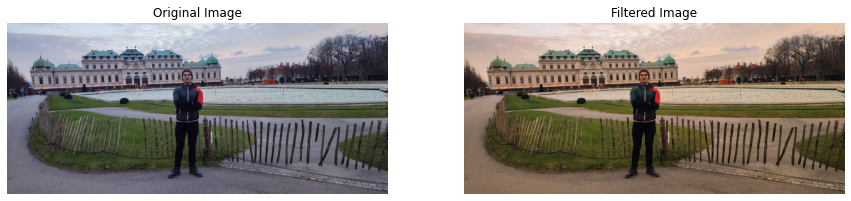

In [34]:
img = img2
img_warm = warm_filter(img)
plot(img, img_warm)

As we can see, the red values are increased and the blue values are decreased

# Cold_filter

In [35]:
def Cold_filter(img):
    # We are giving y values for a set of x values.
    # And calculating y for [0-255] x values accordingly to the given range.
    increase_table = UnivariateSpline(x=[0, 64, 128, 255], y=[0, 75, 155, 255])(range(256))
 
    # Similarly construct a lookuptable for decreasing pixel values.
    decrease_table = UnivariateSpline(x=[0, 64, 128, 255], y=[0, 45, 95, 255])(range(256))
    # Split the blue, green, and red channel of the image.
    blue_channel, green_channel, red_channel = cv2.split(img)
    
    # Decrease red channel intensity using the constructed lookuptable.
    red_channel = cv2.LUT(red_channel, decrease_table).astype(np.uint8)
    
    # Increase blue channel intensity using the constructed lookuptable.
    blue_channel = cv2.LUT(blue_channel, increase_table).astype(np.uint8)
    
    # Merge the blue, green, and red channel. 
    filterd_img = cv2.merge((blue_channel, green_channel, red_channel))
    
    return(filterd_img)

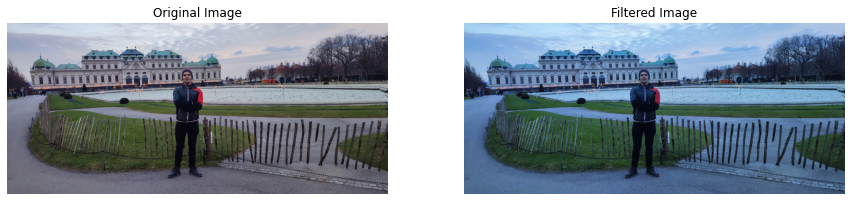

In [36]:
img = img2
img_cold = Cold_filter(img)
plot(img, img_cold)

### Here you can take a look at:

#### [Streamlit App](https://ahed-jneed-image-filter-app-image-filter-streamlit-app-6nf9ik.streamlit.app/)

#### [Github Repositories](https://github.com/ahed-jneed/Image-Filter-App)

## Referenz:

* [OpenCV for beginners](https://opencv.org/course-opencv-for-beginners/)

### I hope you enjoyed this notebook